In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import sys
sys.path.insert(0,'../build/src/')
import libimp
plotly.offline.init_notebook_mode()

In [57]:
data_path = "../Data/SST/"
ts_sst = np.load(data_path+"mediterranean_sst.npy").astype(np.float64)
date_sst = np.load(data_path+"mediterranean_ts_date.npy")
window_size = 7
interval_length = 61
exclude = 14
start_year = np.datetime64(date_sst[0], 'Y').astype(int) + 1970
end_year = np.datetime64(date_sst[-1], 'Y').astype(int) + 1970
period_starts = []
for year in range(start_year, end_year+1):
    period_starts.append(np.where(date_sst == np.datetime64(str(year) + "-01-01"))[0][0])
block_width = 500
block_height = 500

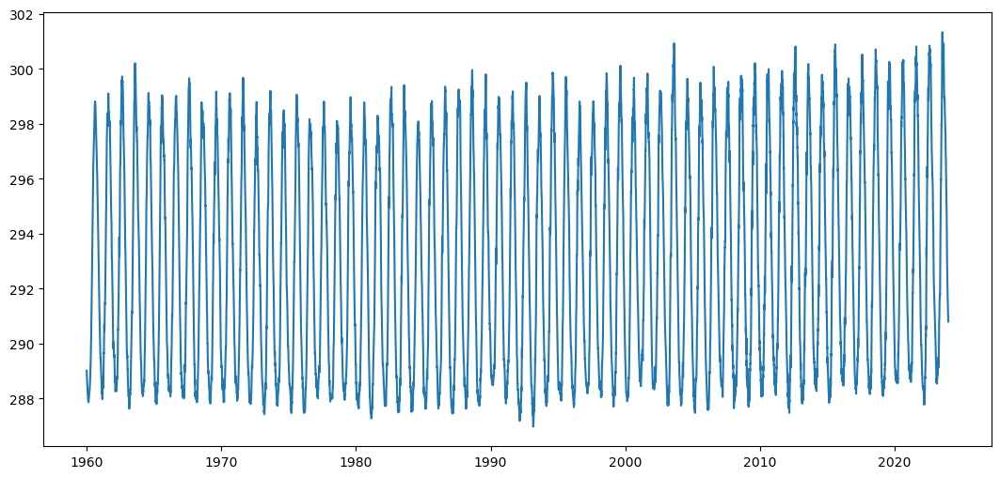

In [58]:
plt.figure(figsize=(13,6))
plt.plot(date_sst, ts_sst)
plt.show()

In [59]:
mp_sst, mp_index_sst = libimp.STOMP_double(ts_sst, window_size, exclude, block_width, block_width)
imp_sst, imp_index_sst = libimp.imp_STOMP_double(ts_sst, window_size, period_starts, interval_length, exclude)

imp_3NN, imp_3NN_index = libimp.imp_STOMP_knn_double(ts_sst, window_size, period_starts, interval_length, exclude, 3)
imp_5NN, imp_5NN_index = libimp.imp_STOMP_knn_double(ts_sst, window_size, period_starts, interval_length, exclude, 5)
imp_10NN, imp_10NN_index = libimp.imp_STOMP_knn_double(ts_sst, window_size, period_starts, interval_length, exclude, 10)

size = len(mp_sst)

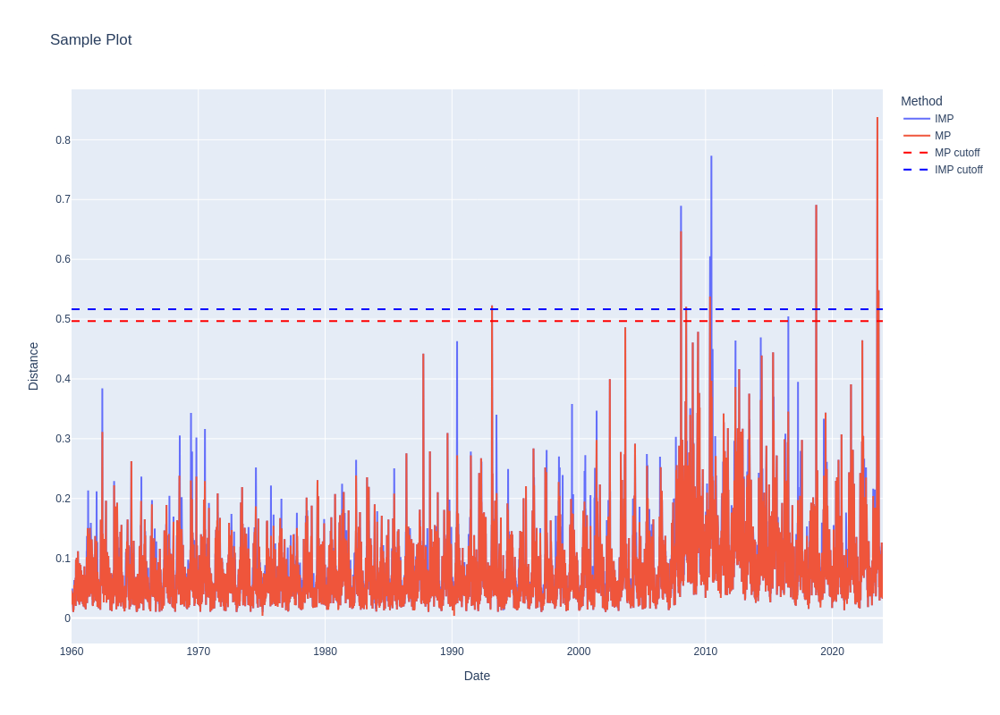

In [60]:
mp_date = date_sst[:size]
ind_discord_mp = np.argpartition(mp_sst, -30)[-30:]
ind_discord_imp = np.argpartition(imp_sst, -30)[-30:]

cut_off_mp = np.min(mp_sst[ind_discord_mp])
cut_off_imp = np.min(imp_sst[ind_discord_imp])

hover_text_mp = [f"NN: {date_sst[ind]}" for ind in mp_index_sst]
hover_text_imp = [f"NN: {date_sst[ind]}" for ind in imp_index_sst]
fig = go.Figure()
# Add traces
fig.add_trace(go.Scatter(x=mp_date, y=imp_sst, mode='lines', name='IMP', text=hover_text_imp))
fig.add_trace(go.Scatter(x=mp_date, y=mp_sst, mode='lines', name='MP', text=hover_text_mp))
fig.add_trace(go.Scatter(x=mp_date, y=np.zeros(mp_date.shape[0]) + cut_off_mp, mode='lines', line=dict(dash='dash',color='red'), name='MP cutoff', hoverinfo='skip'))
fig.add_trace(go.Scatter(x=mp_date, y=np.zeros(mp_date.shape[0]) + cut_off_imp, mode='lines', line=dict(dash='dash',color='blue'), name='IMP cutoff', hoverinfo='skip'))
# Update layout
fig.update_layout(
    title="Sample Plot",
    xaxis_title="Date",
    yaxis_title="Distance",
    legend_title="Method",
    autosize=True,
    #width=1300,
    height=800,
    hovermode='x unified',
)
# Show the figure
fig.show()

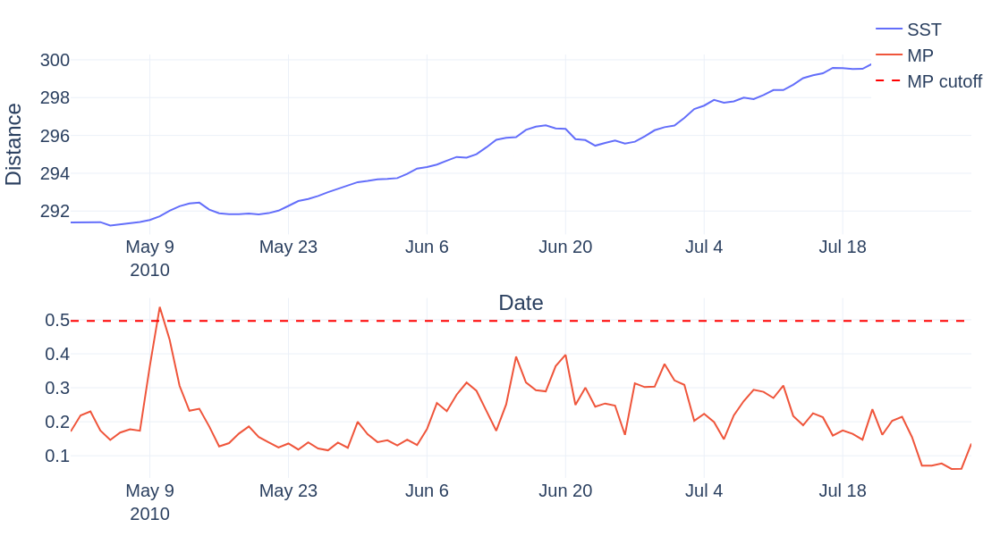

In [100]:
date = np.where((mp_date>=np.datetime64("2010-05-01")) & (mp_date<=np.datetime64("2010-07-31")))[0]

fig = make_subplots(rows=2, cols=1)
# Add traces
fig.add_trace(go.Scatter(x=mp_date[date], y=ts_sst[date], mode='lines', name='SST', text=hover_text_mp),row=1, col=1)
fig.add_trace(go.Scatter(x=mp_date[date], y=mp_sst[date], mode='lines', name='MP', text=hover_text_mp),row=2, col=1)
fig.add_trace(go.Scatter(x=mp_date[date], y=np.zeros(mp_date[date].shape[0]) + cut_off_mp, mode='lines', line=dict(dash='dash',color='red'), name='MP cutoff', hoverinfo='skip'),row=2, col=1)

# Update layout
fig.update_layout(
    xaxis_title="Date",
    yaxis_title="Distance",
    autosize=False,
    width=900,
    height=600,
    hovermode='x unified',
    template="plotly_white",
    font_size=20
)
# Add annotation

fig.update_layout(margin=dict(l=20, r=20, t=20, b=20))
fig.update_layout(legend=dict(
    yanchor="middle",
    xanchor="right",
))
fig.show()


fig = make_subplots(rows=1, cols=2, shared_yaxes=True,  horizontal_spacing=0.02, subplot_titles=("June", "October"))
dates = np.where((date_sst>=np.datetime64(f"{year}-06-01")) & (date_sst<=np.datetime64(f"{year}-06-30")))

for year in range(start_year, end_year+1):
    dates = np.where((date_sst>=np.datetime64(f"{year}-06-01")) & (date_sst<=np.datetime64(f"{year}-06-30")))[0]
    fig.add_trace(go.Scatter(x=pd.to_datetime(date_sst[dates]).strftime("%d"), y=ts_sst[dates], mode='lines', line=dict(color="lightgrey",width=1),name='SST', text=f"{year}"),row=1, col=1)
x = np.arange(31)
for year in range(start_year, end_year+1):
    dates = np.where((date_sst>=np.datetime64(f"{year}-10-01")) & (date_sst<=np.datetime64(f"{year}-10-31")))[0]
    fig.add_trace(go.Scatter(x=pd.to_datetime(date_sst[dates]).strftime("%d"), y=ts_sst[dates], mode='lines', line=dict(color="lightgrey",width=1), name='SST', text=f"{year}"),row=1, col=2)

dates = np.where((mp_date>=np.datetime64("2010-06-18")) & (mp_date<=np.datetime64("2010-06-24")))[0]
x = np.arange(7)
fig.add_trace(go.Scatter(x=pd.to_datetime(date_sst[dates]).strftime("%d"), y=ts_sst[dates], mode='lines', line=dict(color="red",width=4), name='SST', text=f"{year}"),row=1, col=1)

dates = np.where((mp_date>=np.datetime64("2007-10-12")) & (mp_date<=np.datetime64("2007-10-18")))[0]
x = np.arange(7)
fig.add_trace(go.Scatter(x=pd.to_datetime(date_sst[dates]).strftime("%d"), y=ts_sst[dates], mode='lines', line=dict(color="red",width=4), name='SST', text=f"{year}"),row=1, col=2)


fig.update_yaxes(title_text="Temperature (°K)", row=1, col=1)
fig.update_annotations(font_size=20)
# Update layout
fig.update_layout(
    autosize=False,
    width=900,
    height=600,
    template="plotly_white",
    font_size=20,   
    showlegend=False,
    xaxis1 = dict(
        tickmode = 'linear',
        dtick = 5
    ),
    xaxis2 = dict(
        tickmode = 'linear',
        dtick = 5
    )
)
# Add annotation

fig.update_layout(margin=dict(l=20, r=20, t=25, b=20))
fig.write_image("seq_to_seq.pdf", engine="kaleido")
#fig.show()

In [66]:
dates = np.where((mp_date>=np.datetime64("2010-06-18")) & (mp_date<=np.datetime64("2010-06-24")))[0]
seq = ts_sst[dates]
seq[-2] - seq[0]

-1.0750218128938513

Index(['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24',
       '25', '26', '27', '28', '29', '30'],
      dtype='object')